# Preprocessing and augmentation


In [50]:
import tensorflow as tf
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import imageio
import seaborn as sns
from PIL import Image
from matplotlib.colors import ListedColormap
from sklearn.metrics import adjusted_rand_score,jaccard_score,f1_score, precision_score, recall_score
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import (
        Input,
        Conv2D,
        MaxPool2D,
        MaxPooling2D,
        UpSampling2D,
        Conv2DTranspose,
        BatchNormalization,
        Concatenate,
        concatenate,
        Activation,
        Dropout,
        RandomFlip,
        RandomRotation,
        Cropping2D,
        Resizing,
        Dense
)

In [51]:
# Function to map the class index to the corresponding RGB color
def convert_to_label(rgb_mask, class_mapping, color_threshold=30):
    label_mask = np.zeros((rgb_mask.shape[0], rgb_mask.shape[1]), dtype=np.uint8)
    
    for label, rgb in class_mapping.items():
        
        distances = np.sqrt(
        np.sum((rgb_mask - np.array(rgb)) ** 2, axis=-1)
        )
        mask = distances < color_threshold
        label_mask[mask] = label

    return label_mask

# Function to create an array of masks that can be used directly in plotting
def create_mask_array(pred_mask): 
    pred_mask = np.argmax(pred_mask, axis=-1)  
    return pred_mask  
def create_mask(pred_mask): 
    pred_mask = np.argmax(pred_mask, axis=-1)  
    return pred_mask [0]    

# Function to resize and normalize images and their corresponding ground truth masks
def preprocess_image(img, mask=None, target_size=(256, 256)):
    img = img.resize(target_size)
    if mask is not None:
        mask = mask.resize(target_size)
        mask = np.array(mask)
        mask = convert_to_label(mask,class_colors)
    img = np.array(img) / 255.0  # Normalize to [0, 1]

    if mask is not None:
        return img, mask
    else : 
        return img

# Apply augmentations to both image and mask
def augment(img, mask):

    mask_expanded = np.expand_dims(mask, axis=-1)
    image_aug_layer = tf.keras.Sequential([
        tf.keras.layers.RandomFlip("horizontal_and_vertical"),
        tf.keras.layers.RandomRotation(0.2),
        tf.keras.layers.RandomZoom(0.2)
    ])
    mask_aug_layer = tf.keras.Sequential([
        tf.keras.layers.RandomFlip("horizontal_and_vertical"),
        tf.keras.layers.RandomRotation(0.2),
        tf.keras.layers.RandomZoom(0.2)
    ])
    img_aug = image_aug_layer(tf.expand_dims(img, axis=0))[0]
    mask_aug = mask_aug_layer(tf.expand_dims(mask_expanded, axis=0))[0]
    mask_aug = mask_aug[..., 0]
    
    return img_aug, mask_aug

class_colors = {
    0: [0, 0, 0],  # Background clutter
    1: [128, 0, 0],  # Building
    2: [128, 64, 128],  # Road
    3: [0, 128, 0],  # Tree
    4: [128, 128, 0],  # Low vegetation
    5: [64, 0, 128],  # Moving car
    6: [192, 0, 192],  # Static car
    7: [64, 64, 0],  # Human
}

train_image_folder = "/kaggle/input/semantic-segmentation-of-street-scenes/IPProjectDataset24/train_data/Images"
train_mask_folder = "/kaggle/input/semantic-segmentation-of-street-scenes/IPProjectDataset24/train_data/Labels"

val_image_folder="/kaggle/input/semantic-segmentation-of-street-scenes/IPProjectDataset24/val_data/Images"
val_mask_folder = "/kaggle/input/semantic-segmentation-of-street-scenes/IPProjectDataset24/val_data/Labels"

test_folder="/kaggle/input/semantic-segmentation-of-street-scenes/IPProjectDataset24/test_data/Images"



#####################################    Get sorted file paths      #################################
train_image_paths = sorted(
    [os.path.join(train_image_folder, fname) for fname in os.listdir(train_image_folder) if fname.endswith(('.jpg', '.png'))])
mask_paths = sorted(
    [os.path.join(train_mask_folder, fname) for fname in os.listdir(train_mask_folder) if fname.endswith(('.jpg', '.png'))])

val_image_paths = sorted(
    [os.path.join(val_image_folder, fname) for fname in os.listdir(val_image_folder) if fname.endswith(('.jpg', '.png'))])
val_mask_paths = sorted(
    [os.path.join(val_mask_folder, fname) for fname in os.listdir(val_mask_folder) if fname.endswith(('.jpg', '.png'))])

test_paths=sorted(
    [os.path.join(test_folder, fname) for fname in os.listdir(test_folder) if fname.endswith(('.jpg', '.png'))])

In [52]:
######################################        Load images and masks       ####################################


rgb_train_images = [Image.open(img_path).convert('RGB') for img_path in train_image_paths]  # RGB for images
rgb_masks = [Image.open(mask_path).convert('RGB') for mask_path in mask_paths]  # Grayscale for masks

rgb_val_images = [Image.open(img_path).convert('RGB') for img_path in val_image_paths]  # RGB for images
rgb_val_masks = [Image.open(mask_path).convert('RGB') for mask_path in val_mask_paths]  # Grayscale for masks

rgb_test= [Image.open(img_path).convert('RGB') for img_path in test_paths]




In [53]:
######################################  Preprocess all images and masks   ####################################

processed_images = [preprocess_image(img, mask)[0] for img, mask in zip(rgb_train_images, rgb_masks)]
processed_masks = [preprocess_image(img, mask)[1] for img, mask in zip(rgb_train_images, rgb_masks)]

processed_val_images = [preprocess_image(img, mask)[0] for img, mask in zip(rgb_val_images, rgb_val_masks)]
processed_val_masks = [preprocess_image(img, mask)[1] for img, mask in zip(rgb_val_images, rgb_val_masks)]

processed_test = [preprocess_image(img) for img in rgb_test]

In [54]:
######################################  Convert lists to NumPy arrays   ######################################

training_images = np.array(processed_images)
training_masks = np.array(processed_masks)

val_images = np.array(processed_val_images)
val_masks = np.array(processed_val_masks)

test_images = np.array(processed_test)


In [55]:
# Apply augmentation
augmented_images, augmented_masks = [], []
for img, mask in zip(training_images, training_masks):
    img_aug, mask_aug = augment(img, mask)
    augmented_images.append(img_aug)
    augmented_masks.append(mask_aug)

augmented_images_np = tf.stack(augmented_images).numpy()
augmented_masks_np = tf.stack(augmented_masks).numpy()

augmented_training_images = np.concatenate((training_images, augmented_images_np), axis=0)
augmented_training_masks = np.concatenate((training_masks, augmented_masks_np), axis=0)

In [56]:
print(augmented_training_images.shape,augmented_training_masks.shape,val_images.shape,val_masks.shape)

(400, 256, 256, 3) (400, 256, 256) (70, 256, 256, 3) (70, 256, 256)


In [57]:
########################## Bonus1 ######################  ----Caught Imbalance----
def analyze_dataset_distribution(masks):
    flat_masks = masks.flatten()
    unique_classes, class_counts = np.unique(flat_masks, return_counts=True)
    plt.figure(figsize=(10, 5))
    sns.barplot(x=unique_classes, y=class_counts)
    plt.title('Class Distribution in Dataset')
    plt.xlabel('Class')
    plt.ylabel('Number of Pixels')
    plt.tight_layout()
    plt.show()
    total_pixels = len(flat_masks)
    class_weights = {cls: total_pixels / (len(unique_classes) * count)
                     for cls, count in zip(unique_classes, class_counts)}

    return {
        'unique_classes': unique_classes,
        'class_counts': class_counts,
        'class_weights': class_weights
    }

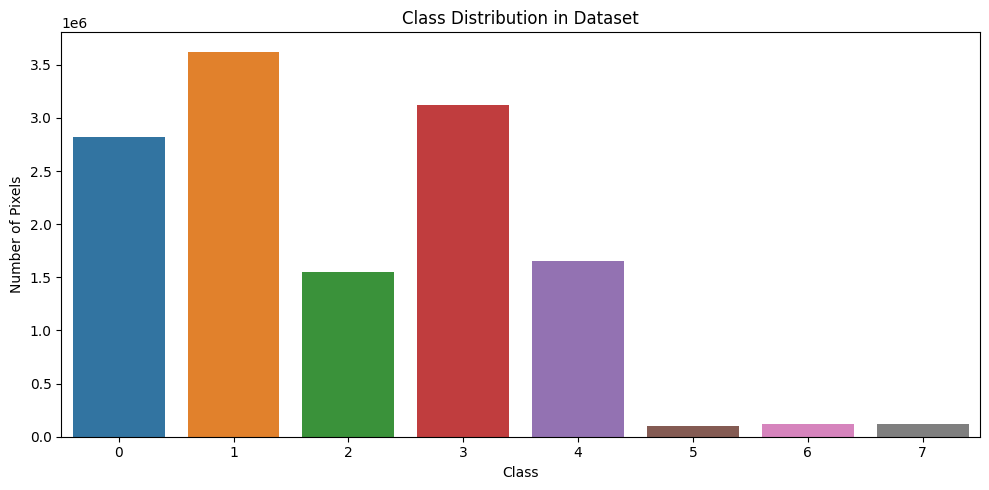

[0 1 2 3 4 5 6 7]
[2817972 3624430 1551866 3118362 1653306  104589  119222  117453]
{0: 0.581411028924347, 1: 0.4520434937355667, 2: 1.0557612577374593, 3: 0.5254040422503866, 4: 0.9909841251407785, 5: 15.66512730784308, 6: 13.742430088406502, 7: 13.949409551054464}


In [58]:
ob = analyze_dataset_distribution(training_masks)
class_weights_dict = ob['class_weights']
print(ob['unique_classes'])
print(ob['class_counts'])
print(ob['class_weights'])

# Evaluation functions


In [59]:
# Plot training history
def plot_history(history):
    plt.figure(figsize=(12, 4))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Loss')
    plt.legend()

    plt.show()

#####Bonus2#######
def dice_coefficient_multiclass(true, pred, num_classes):
    dice_per_class = []
    for class_id in range(num_classes):
        true_binary = (true == class_id).astype(int)
        pred_binary = (pred == class_id).astype(int)
        intersection = np.sum(true_binary * pred_binary)
        dice = (2 * intersection) / (np.sum(true_binary) + np.sum(pred_binary) + 1e-6)
        dice_per_class.append(dice)
    return np.mean(dice_per_class)  


# Model 1 : U-Net


In [60]:
num_of_classes =8
# Define the encoder block
def double_conv_block(inputs, num_filters):
  x = Conv2D(num_filters, 3, padding="same")(inputs)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  x = Conv2D(num_filters, 3, padding="same")(x)
  x = BatchNormalization()(x)
  x = Activation('relu')(x)
  return x

def encoder_block(inputs, num_filters):
  x = double_conv_block(inputs, num_filters)
  p = MaxPool2D((2,2))(x)
  return x, p

def decoder_block(inputs, skip, num_filters):
  x = Conv2DTranspose(num_filters, (2,2), strides=2, padding="same")(inputs)
  x = Concatenate()([x, skip])
  x = double_conv_block(x, num_filters)
  return x


def build_unet(input_shape):
    inputs = Input(input_shape)

    # Encoder
    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    # Bridge
    b1 = double_conv_block(p4, 1024)

    # Decoder
    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    # Output layer for 8 classes
    outputs = layers.Conv2D(num_of_classes, 1, padding="same", activation="softmax")(d4)
    model = models.Model(inputs, outputs, name="UNET")
    return model

In [61]:
input_shape = (256, 256, 3)  # Example input shape
unet = build_unet(input_shape)

unet.compile(optimizer='adam',
               loss="sparse_categorical_crossentropy",
              metrics=['accuracy'])
EPOCHS = 140
unet.summary()

Model: "UNET"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1211    │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_81 (Conv2D)  │ (None, 256, 256,  │      1,792 │ input_layer_1211… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_81[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_58       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_82 (Conv2D)  │ (None, 256, 256,  │     36,928 │ activation_58[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        256 │ conv2d_82[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_59       │ (None, 256, 256,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 128, 128,  │          0 │ activation_59[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_83 (Conv2D)  │ (None, 128, 128,  │     73,856 │ max_pooling2d_3[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_83[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_60       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_84 (Conv2D)  │ (None, 128, 128,  │    147,584 │ activation_60[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        512 │ conv2d_84[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_61       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 64, 64,    │          0 │ activation_61[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_85 (Conv2D)  │ (None, 64, 64,    │    295,168 │ max_pooling2d_4[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │      1,024 │ conv2d_85[0][0] 

 Total params: 31,055,752 (118.47 MB)

 Trainable params: 31,043,976 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [62]:
unet_model_history=unet.fit(augmented_training_images, augmented_training_masks, epochs=120, batch_size=16,validation_data=(val_images, val_masks))

Epoch 1/120
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 878ms/step - accuracy: 0.2830 - loss: 1.9491

W0000 00:00:1734403066.371876      90 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert
W0000 00:00:1734403068.397488      92 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


25/25 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - accuracy: 0.2852 - loss: 1.9422 - val_accuracy: 0.1716 - val_loss: 20.1531
Epoch 2/120
25/25 ━━━━━━━━━━━━━━━━━━━━ 23s 932ms/step - accuracy: 0.4112 - loss: 1.5140 - val_accuracy: 0.1993 - val_loss: 46.9886
Epoch 3/120
25/25 ━━━━━━━━━━━━━━━━━━━━ 23s 922ms/step - accuracy: 0.4117 - loss: 1.4665 - val_accuracy: 0.0944 - val_loss: 28.0631
Epoch 4/120
25/25 ━━━━━━━━━━━━━━━━━━━━ 23s 930ms/step - accuracy: 0.4456 - loss: 1.3906 - val_accuracy: 0.2388 - val_loss: 2.1864
Epoch 5/120
25/25 ━━━━━━━━━━━━━━━━━━━━ 23s 931ms/step - accuracy: 0.4285 - loss: 1.3873 - val_accuracy: 0.3354 - val_loss: 1.8893
Epoch 6/120
25/25 ━━━━━━━━━━━━━━━━━━━━ 23s 931ms/step - accuracy: 0.4389 - loss: 1.3385 - val_accuracy: 0.3338 - val_loss: 3.2587
Epoch 7/120
25/25 ━━━━━━━━━━━━━━━━━━━━ 23s 929ms/step - accuracy: 0.4394 - loss: 1.3247 - val_accuracy: 0.3046 - val_loss: 1.6602
Epoch 8/120
25/25 ━━━━━━━━━━━━━━━━━━━━ 23s 928ms/step - accuracy: 0.4312 - loss: 1.3328 - val_accurac

In [63]:
pred_mask_validation=unet.predict(val_images)
pred_mask_validation=create_mask_array(pred_mask_validation)
true_labels = np.concatenate(val_masks).flatten()
predicted_labels = np.concatenate(pred_mask_validation).flatten()

3/3 ━━━━━━━━━━━━━━━━━━━━ 37s 957ms/step


## Evaluation of model 1

In [64]:
####NORMAL Eval####
unet.evaluate(val_images, val_masks)

W0000 00:00:1734405889.168313      90 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 384ms/step - accuracy: 0.7827 - loss: 0.6355


[0.6721796989440918, 0.7696954011917114]

### History Plot

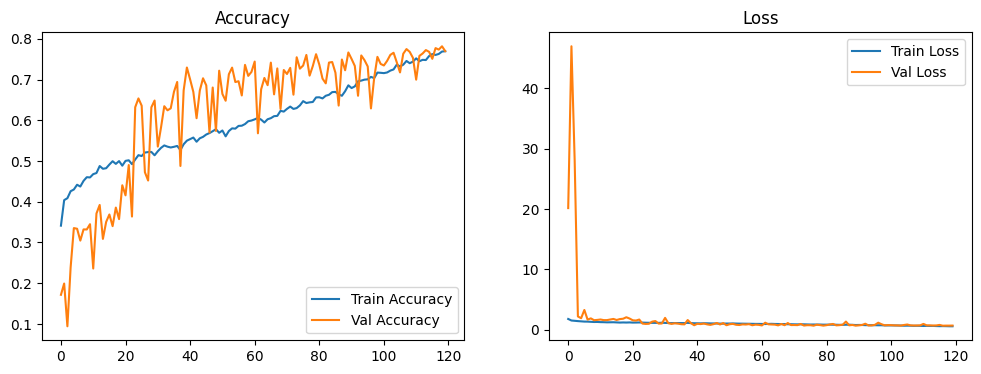

In [65]:
plot_history(unet_model_history)

### Metrics

#### Rand

In [66]:
rand_index=adjusted_rand_score(true_labels,predicted_labels)
print(rand_index)

0.5714647948831915


#### Precison and Recall

In [67]:
precision = precision_score(true_labels, predicted_labels, average='weighted', zero_division=0)
recall = recall_score(true_labels, predicted_labels, average='weighted', zero_division=0)

print(f"Precision: {precision}")
print(f"Recall (Sensitivity): {recall}")

Precision: 0.7690903262120481
Recall (Sensitivity): 0.7696953909737724


#### Jaccard(IOU)

In [68]:
iou = jaccard_score(true_labels, predicted_labels, average='macro')
print(f"Jaccard Index (IoU): {iou}")
class_wise_iou = jaccard_score(true_labels, predicted_labels, average=None)
print(f"Class-wise IoU: {class_wise_iou}")

Jaccard Index (IoU): 0.4965088181145338
Class-wise IoU: [0.45287326 0.80221686 0.63353758 0.65118047 0.54922906 0.52937572
 0.3528316  0.00082599]


#### Dice

In [69]:
dice_coefficient = f1_score(true_labels, predicted_labels, average='macro')
print(f"Dice Coefficient using built-in f1score: {dice_coefficient}")

Dice Coefficient using built-in f1score: 0.6253329928302913


In [70]:
dice = dice_coefficient_multiclass(true_labels, predicted_labels, 8)
print(f"Dice Coefficient: {dice}")

Dice Coefficient: 0.6253329928278998


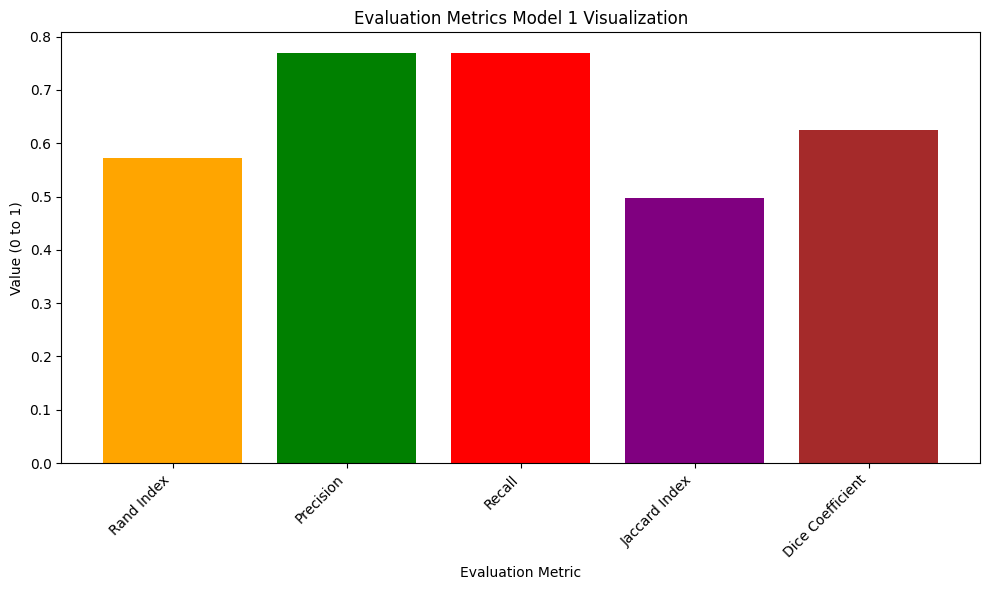

In [71]:
#####Bonus3#####
metrics = {
    'Rand Index': rand_index,
    'Precision': precision,
    'Recall': recall,
    'Jaccard Index': iou,
    'Dice Coefficient': dice_coefficient
}
metric_names = list(metrics.keys())
metric_values = list(metrics.values())
plt.figure(figsize=(10, 6))
plt.bar(metric_names, metric_values, color=['orange', 'green', 'red', 'purple', 'brown'])
plt.xlabel('Evaluation Metric')
plt.ylabel('Value (0 to 1)')
plt.title('Evaluation Metrics Model 1 Visualization')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


# Model 2 : FCN

In [72]:
####################Modifications###################

def fcn(input_shape=(256, 256, 3), num_classes=8):
    inputs = Input(shape=input_shape)
    # Encoder
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    pool1 = MaxPooling2D((2, 2))(conv1)
    Dropout(0.3)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling2D((2, 2))(conv2)
    Dropout(0.3)
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    Dropout(0.2)
    # Decoder
    up1 = Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same')(conv3)
    up1 = concatenate([up1, conv2])
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(up1)
    Dropout(0.3)
    up2 = Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same')(conv4)
    up2 = concatenate([up2, conv1])
    conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(up2)
    Dropout(0.3)
    # Output
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(conv5)
    return Model(inputs, outputs)
FCN = fcn()
FCN.summary()


Model: "functional_1219"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1212    │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_100 (Conv2D) │ (None, 256, 256,  │      1,792 │ input_layer_1212… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_7     │ (None, 128, 128,  │          0 │ conv2d_100[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_101 (Conv2D) │ (None, 128, 128,  │     73,856 │ max_pooling2d_7[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 64, 64,    │          0 │ conv2d_101[0][0]  │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_102 (Conv2D) │ (None, 64, 64,    │    295,168 │ max_pooling2d_8[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_35 │ (None, 128, 128,  │    295,040 │ conv2d_102[0][0]  │
│ (Conv2DTranspose)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_35      │ (None, 128, 128,  │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 256)              │            │ conv2d_101[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_103 (Conv2D) │ (None, 128, 128,  │    295,040 │ concatenate_35[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_36 │ (None, 256, 256,  │     73,792 │ conv2d_103[0][0]  │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_36      │ (None, 256, 256,  │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 128)              │            │ conv2d_100[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_104 (Conv2D) │ (None, 256, 256,  │     73,792 │ concatenate_36[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_105 (Conv2D) │ (None, 256, 256,  │        520 │ conv2d_104[0][0]  │
│                     │ 8)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 1,109,000 (4.23 MB)

 Trainable params: 1,109,000 (4.23 MB)

 Non-trainable params: 0 (0.00 B)

In [73]:
FCN.compile(optimizer='adam',
             loss='sparse_categorical_crossentropy',
             metrics=['accuracy'])
FCN_model_history=FCN.fit(augmented_training_images, augmented_training_masks, epochs=130, batch_size=16,validation_data=(val_images, val_masks))

Epoch 1/130
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step - accuracy: 0.2063 - loss: 1.8334

W0000 00:00:1734405927.028370      92 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert
W0000 00:00:1734405927.783809      89 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


25/25 ━━━━━━━━━━━━━━━━━━━━ 32s 621ms/step - accuracy: 0.2074 - loss: 1.8295 - val_accuracy: 0.3324 - val_loss: 1.6455
Epoch 2/130
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 345ms/step - accuracy: 0.2857 - loss: 1.6213 - val_accuracy: 0.4240 - val_loss: 1.4776
Epoch 3/130
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 341ms/step - accuracy: 0.3297 - loss: 1.5714 - val_accuracy: 0.4414 - val_loss: 1.4637
Epoch 4/130
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 334ms/step - accuracy: 0.3278 - loss: 1.5711 - val_accuracy: 0.4840 - val_loss: 1.3601
Epoch 5/130
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 330ms/step - accuracy: 0.3550 - loss: 1.5375 - val_accuracy: 0.5024 - val_loss: 1.3144
Epoch 6/130
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 326ms/step - accuracy: 0.3589 - loss: 1.5210 - val_accuracy: 0.5194 - val_loss: 1.3761
Epoch 7/130
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 324ms/step - accuracy: 0.3668 - loss: 1.5187 - val_accuracy: 0.4837 - val_loss: 1.2959
Epoch 8/130
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 324ms/step - accuracy: 0.3519 - loss: 1.5271 - val_accuracy: 0.533

In [74]:
pred_mask_val2=FCN.predict(val_images)
pred_mask_val2=create_mask_array(pred_mask_val2)
true_labels2 = np.concatenate(val_masks).flatten()
predicted_labels2 = np.concatenate(pred_mask_val2).flatten()

3/3 ━━━━━━━━━━━━━━━━━━━━ 16s 259ms/step


## Evaluation of Model 2

In [75]:
####NORMAL Eval####
FCN.evaluate(val_images, val_masks)

W0000 00:00:1734407019.431779      90 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 132ms/step - accuracy: 0.7240 - loss: 0.7627


[0.7940237522125244, 0.7106974720954895]

### History Ploit

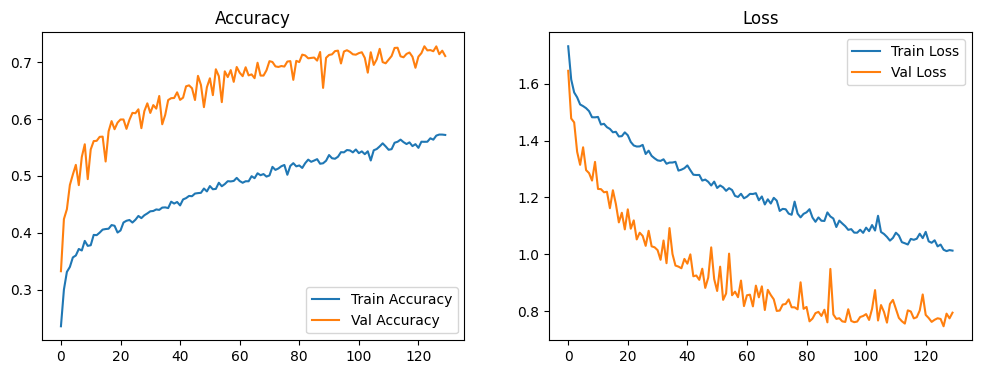

In [76]:
plot_history(FCN_model_history)

### Metrics

#### Rand

In [77]:
rand_index2=adjusted_rand_score(true_labels2,predicted_labels2)
print(rand_index2)

0.4687927907560806


#### IOU

In [78]:
iou = jaccard_score(true_labels2, predicted_labels2, average='macro')
print(f"Jaccard Index (IoU): {iou}")
class_wise_iou = jaccard_score(true_labels2, predicted_labels2, average=None)
print(f"Class-wise IoU: {class_wise_iou}")

Jaccard Index (IoU): 0.42062302117528444
Class-wise IoU: [0.38586079 0.7175823  0.47317494 0.58799582 0.51843341 0.39501021
 0.28079524 0.00613146]


#### Precision And Recall

In [79]:
precision = precision_score(true_labels2, predicted_labels2, average='weighted', zero_division=0)
recall = recall_score(true_labels2, predicted_labels2, average='weighted', zero_division=0)

print(f"Precision: {precision}")
print(f"Recall (Sensitivity): {recall}")

Precision: 0.7111080851836209
Recall (Sensitivity): 0.710697501046317


#### Dice Coeff

In [80]:
dice_coefficient = f1_score(true_labels2, predicted_labels2, average='macro')
print(f"Dice Coefficient using built-in f1score: {dice_coefficient}")

Dice Coefficient using built-in f1score: 0.5593993815731895


In [81]:
dice = dice_coefficient_multiclass(true_labels2, predicted_labels2, 8)
print(f"Dice Coefficient: {dice}")

Dice Coefficient: 0.5593993815707674


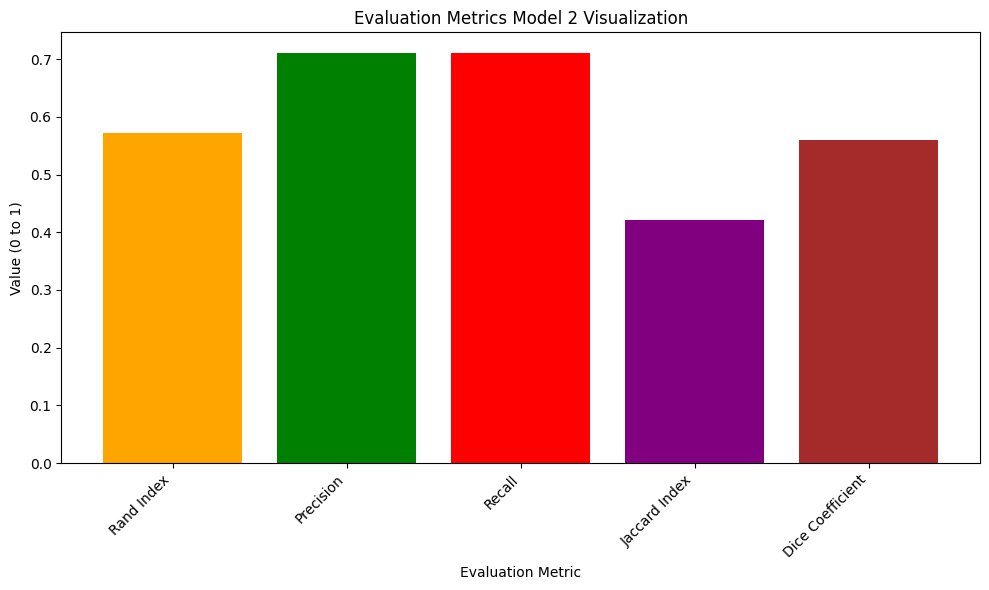

In [82]:
metrics2 = {
    'Rand Index': rand_index,
    'Precision': precision,
    'Recall': recall,
    'Jaccard Index': iou,
    'Dice Coefficient': dice_coefficient
}
metric_names = list(metrics2.keys())
metric_values = list(metrics2.values())
plt.figure(figsize=(10, 6))
plt.bar(metric_names, metric_values, color=['orange', 'green', 'red', 'purple', 'brown'])
plt.xlabel('Evaluation Metric')
plt.ylabel('Value (0 to 1)')
plt.title('Evaluation Metrics Model 2 Visualization')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


# Model 3 : DeepLabV3

In [39]:
def build_unet(input_shape=(256, 256, 3), num_classes=8):
    inputs = Input(shape=input_shape)
    # Encoder
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    # Decoder
    u5 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c4)
    u5 = Concatenate()([u5, c3])
    c5 = Conv2D(256, (3, 3), activation='relu', padding='same')(u5)
    c5 = Conv2D(256, (3, 3), activation='relu', padding='same')(c5)
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = Concatenate()([u6, c2])
    c6 = Conv2D(128, (3, 3), activation='relu', padding='same')(u6)
    c6 = Conv2D(128, (3, 3), activation='relu', padding='same')(c6)
    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = Concatenate()([u7, c1])
    c7 = Conv2D(64, (3, 3), activation='relu', padding='same')(u7)
    c7 = Conv2D(64, (3, 3), activation='relu', padding='same')(c7)
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(c7)
    model = Model(inputs, outputs)
    return model

def DeepLabV3Plus(input_shape=(256, 256, 3), num_classes=8):
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

    for layer in base_model.layers:
        layer.trainable = False

    unet_model = build_unet(input_shape=input_shape, num_classes=num_classes)

    x = base_model.output
    
    x = Resizing(256, 256)(x)

    x = Conv2D(3, (1, 1), activation='relu', padding='same')(x)

    unet_output = unet_model(x)

    model = Model(inputs=base_model.input, outputs=unet_output)
    model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])
    
    return model

In [40]:
model3 = DeepLabV3Plus()
model3.summary()

Model: "functional_817"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_809     │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer_809[… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 31,291,659 (119.37 MB)

 Trainable params: 7,703,947 (29.39 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [41]:
model3.fit(augmented_training_images,augmented_training_masks,epochs=70, batch_size=4,validation_data=(val_images, val_masks))

Epoch 1/70


I0000 00:00:1734396249.262214      92 service.cc:145] XLA service 0x589bb0ae1c40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734396249.262268      92 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1734396249.262272      92 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1734396291.023079      92 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step - accuracy: 0.2071 - loss: 1.8049

W0000 00:00:1734396331.890959      89 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert
W0000 00:00:1734396338.006396      92 assert_op.cc:38] Ignoring Assert operator compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/assert_equal_1/Assert/Assert


100/100 ━━━━━━━━━━━━━━━━━━━━ 109s 579ms/step - accuracy: 0.2074 - loss: 1.8039 - val_accuracy: 0.3541 - val_loss: 1.5951
Epoch 2/70
100/100 ━━━━━━━━━━━━━━━━━━━━ 43s 427ms/step - accuracy: 0.2733 - loss: 1.6276 - val_accuracy: 0.3416 - val_loss: 1.6376
Epoch 3/70
100/100 ━━━━━━━━━━━━━━━━━━━━ 42s 423ms/step - accuracy: 0.2773 - loss: 1.6215 - val_accuracy: 0.3617 - val_loss: 1.5874
Epoch 4/70
100/100 ━━━━━━━━━━━━━━━━━━━━ 42s 424ms/step - accuracy: 0.2851 - loss: 1.6130 - val_accuracy: 0.3440 - val_loss: 1.5918
Epoch 5/70
100/100 ━━━━━━━━━━━━━━━━━━━━ 42s 425ms/step - accuracy: 0.2828 - loss: 1.6160 - val_accuracy: 0.3429 - val_loss: 1.6120
Epoch 6/70
100/100 ━━━━━━━━━━━━━━━━━━━━ 42s 420ms/step - accuracy: 0.2805 - loss: 1.6210 - val_accuracy: 0.3613 - val_loss: 1.5821
Epoch 7/70
100/100 ━━━━━━━━━━━━━━━━━━━━ 42s 423ms/step - accuracy: 0.2754 - loss: 1.6252 - val_accuracy: 0.3446 - val_loss: 1.6186
Epoch 8/70
100/100 ━━━━━━━━━━━━━━━━━━━━ 42s 423ms/step - accuracy: 0.2882 - loss: 1.6185 - va

In [89]:
##################Bonus5######Fine Tuning
for layer in model3.layers:
    layer.trainable = True
model3.fit(augmented_training_images,augmented_training_masks,epochs=30, batch_size=4
           ,validation_data=(val_images, val_masks))

Epoch 1/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 42s 420ms/step - accuracy: 0.3433 - loss: 1.5369 - val_accuracy: 0.4157 - val_loss: 1.5138
Epoch 2/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 41s 409ms/step - accuracy: 0.3356 - loss: 1.5443 - val_accuracy: 0.4199 - val_loss: 1.4960
Epoch 3/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 41s 412ms/step - accuracy: 0.3403 - loss: 1.5389 - val_accuracy: 0.4066 - val_loss: 1.5034
Epoch 4/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 41s 409ms/step - accuracy: 0.3176 - loss: 1.5645 - val_accuracy: 0.4168 - val_loss: 1.4967
Epoch 5/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 41s 410ms/step - accuracy: 0.3399 - loss: 1.5384 - val_accuracy: 0.4207 - val_loss: 1.4925
Epoch 6/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 41s 410ms/step - accuracy: 0.3331 - loss: 1.5438 - val_accuracy: 0.4185 - val_loss: 1.4969
Epoch 7/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 41s 409ms/step - accuracy: 0.3287 - loss: 1.5615 - val_accuracy: 0.4218 - val_loss: 1.5039
Epoch 8/30
100/100 ━━━━━━━━━━━━━━━━━━━━ 41s 409ms/step - accuracy: 0.3299 - loss: 1

# PREDICTIONS PREVIEW

## VALIDATION DATASET PREVIEW


In [83]:
def display(display_list):
    plt.figure(figsize=(15, 15))
    class_colors = [
    (0 / 255, 0 / 255, 0 / 255),         # Background clutter (Black)
    (128 / 255, 0 / 255, 0 / 255),       # Building (Dark Red)
    (128 / 255, 64 / 255, 128 / 255),    # Road (Purple)
    (0 / 255, 128 / 255, 0 / 255),       # Tree (Green)
    (128 / 255, 128 / 255, 0 / 255),     # Low vegetation (Yellow)
    (64 / 255, 0 / 255, 128 / 255),      # Moving car (Dark Violet)
    (192 / 255, 0 / 255, 192 / 255),     # Static car (Pinkish Violet)
    (64 / 255, 64 / 255, 0 / 255),       # Human (Brown)
]
    cmap = ListedColormap(class_colors)

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        
        # Ensure each item has 3 dimensions
        item = display_list[i]
        if i == 0:  # Input image
            # If image was normalized to [0,1], convert back to [0,255]
            if item.max() <= 1.0:
                item = (item * 255).astype(np.uint8)
            else:
                item = item.astype(np.uint8)
        if len(item.shape) == 2:  # If grayscale, add channel dimension
            item = np.expand_dims(item, axis=-1)

        plt.imshow(item.astype(np.uint8),cmap=cmap)  # Display image as uint8
        plt.axis('off')
    plt.show()

def show_predictions(images=None, masks=None, num=1, model=None):
    if images is not None :
        for i in range(num):
            image = images[i]
            mask=np.zeros(())
            if masks is not None:
                 mask = masks[i]
            image1 = np.expand_dims(image, axis=0)  # Add batch dimension
            pred_mask = model.predict(image1)  # Predict using the model
            display([image, mask, create_mask(pred_mask)])



### U-NET

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


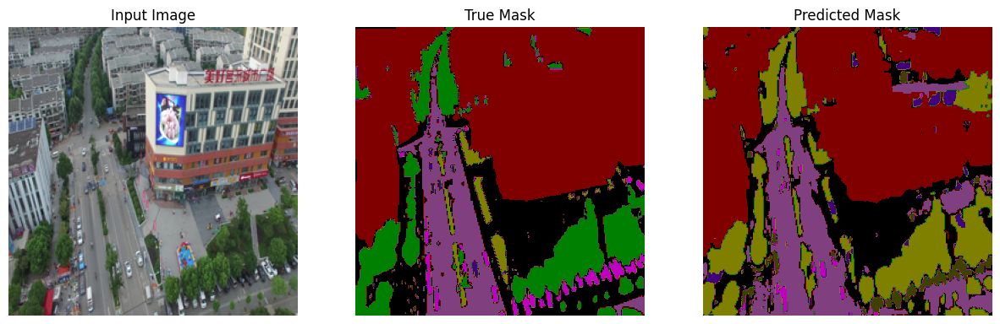

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


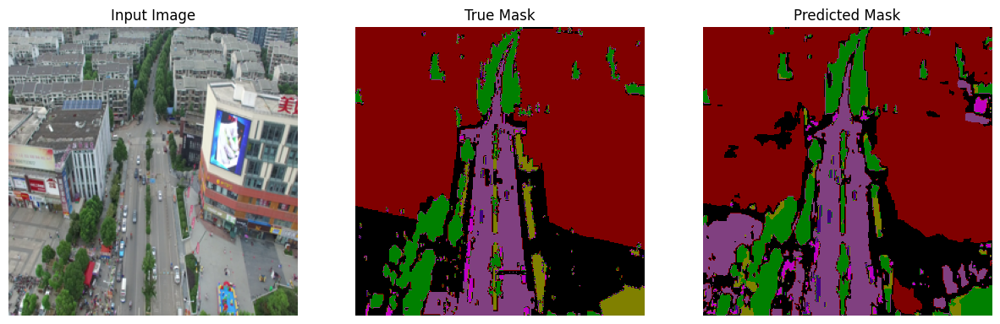

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


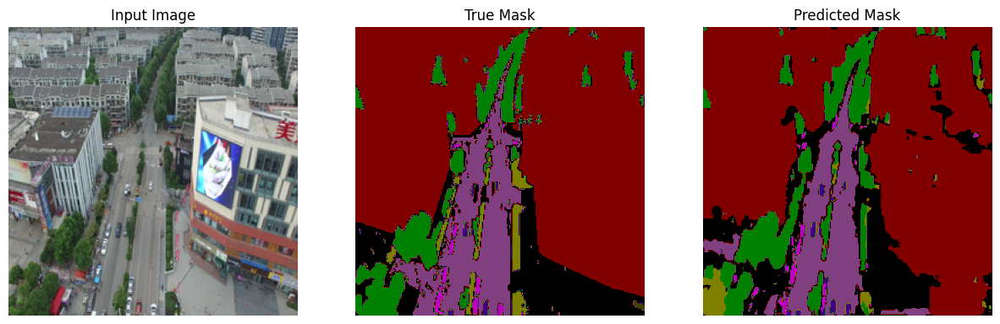

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


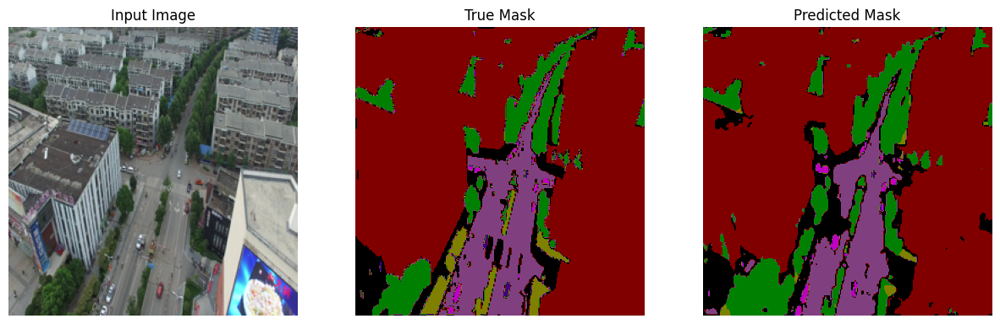

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


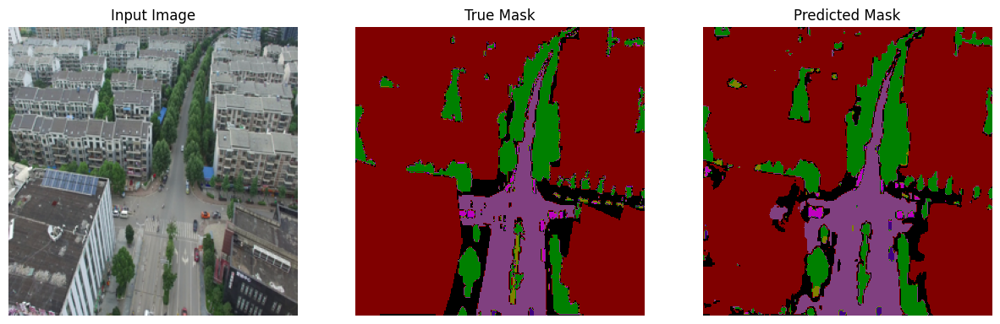

In [84]:
show_predictions(val_images, val_masks, num=5, model=unet)

### FCN

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step


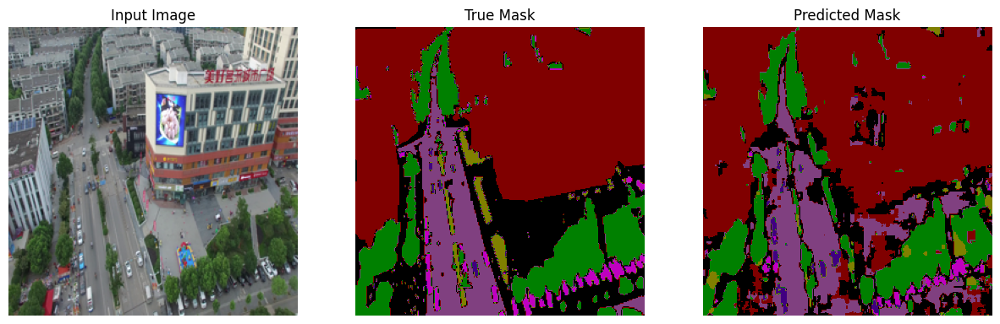

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


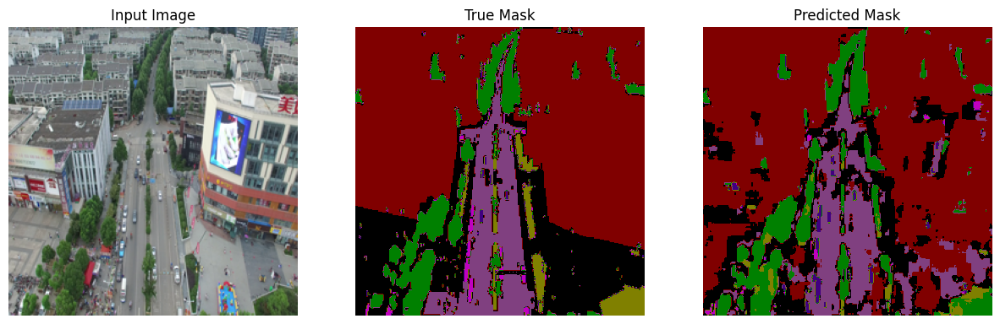

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


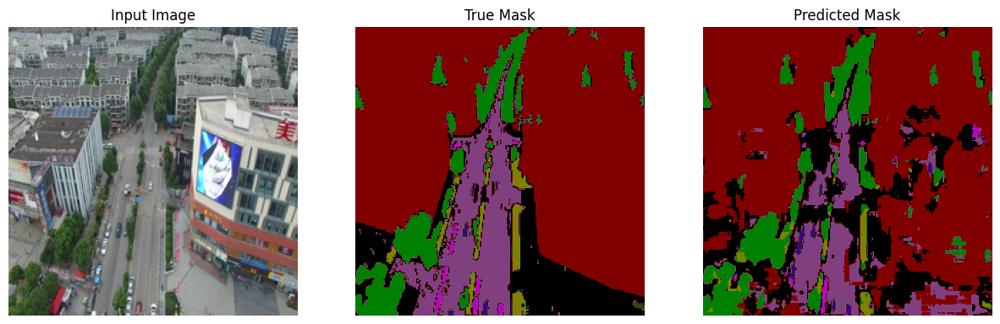

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


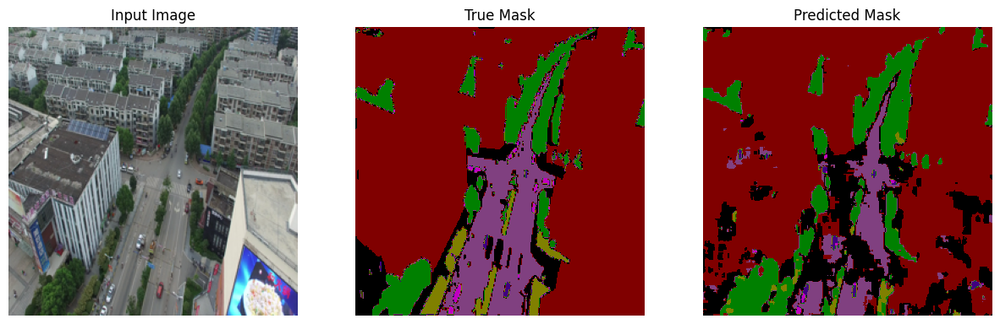

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


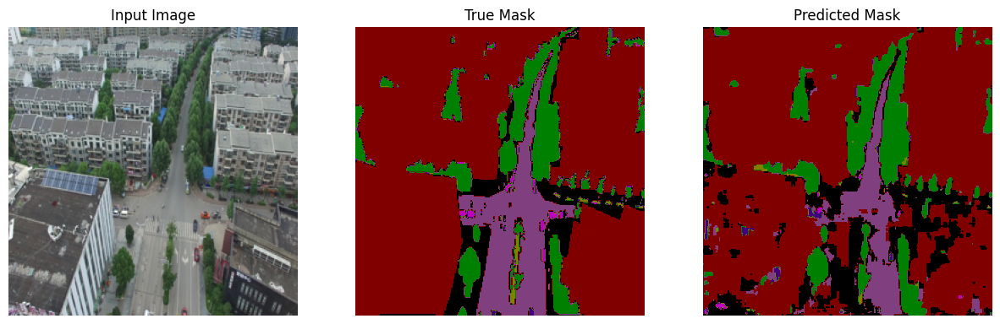

In [85]:
show_predictions(val_images, val_masks, num=5, model=FCN)

### DeepLabV3

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


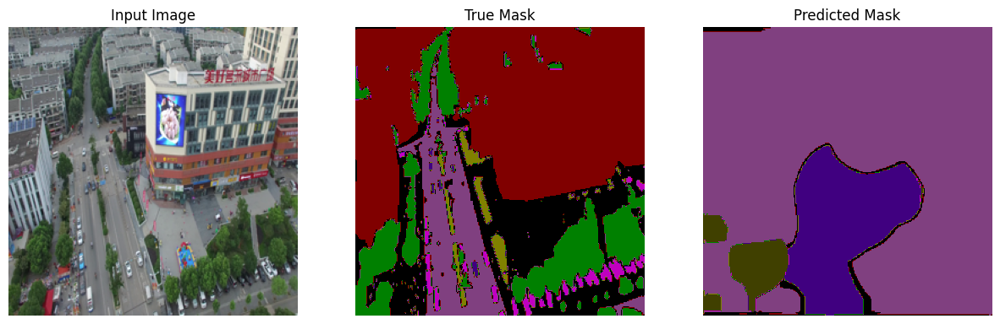

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


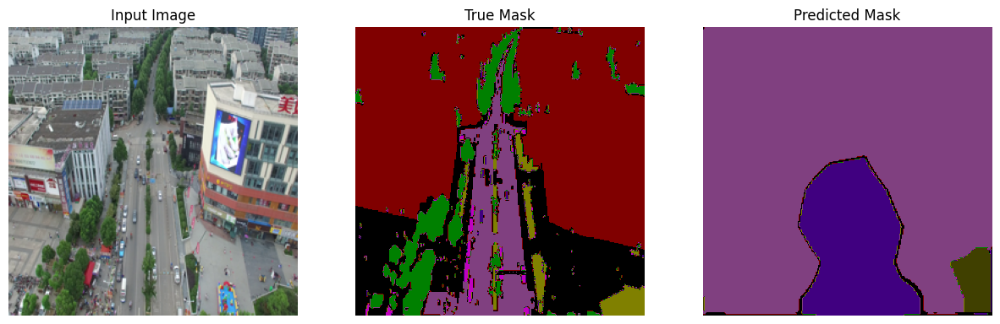

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


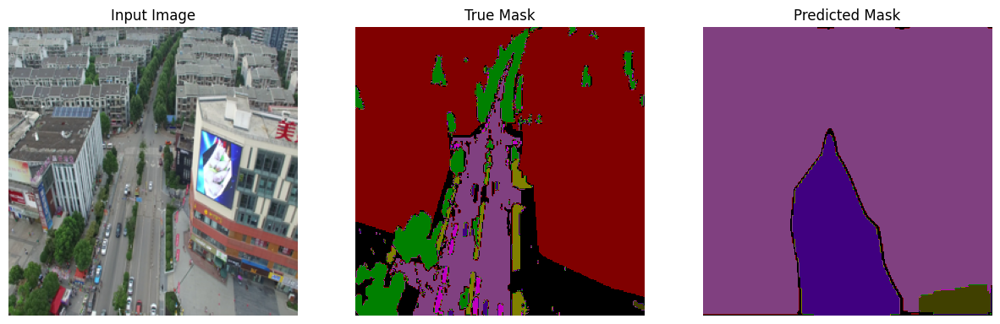

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


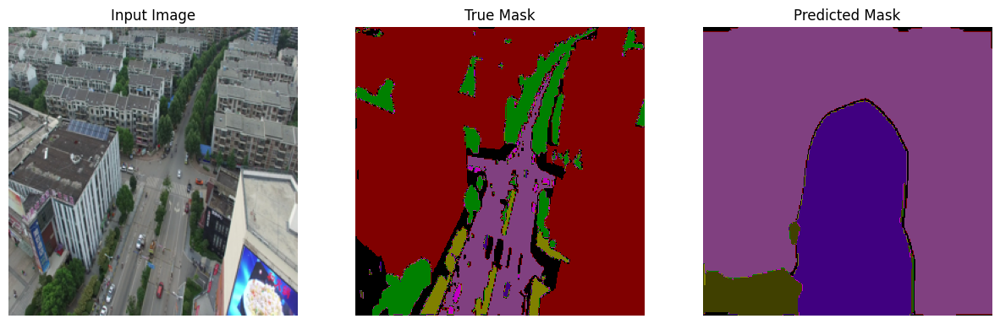

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


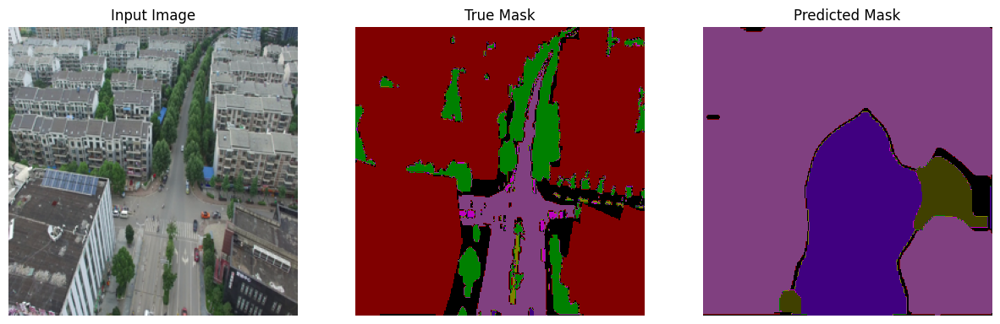

In [47]:
show_predictions(val_images, val_masks, num=5, model=model3)

## TESTING DATASET PREVIEW

In [86]:
def display_test(image, pred_mask):
    plt.figure(figsize=(10, 10))
    class_colors = [
        (0 / 255, 0 / 255, 0 / 255),         # Background clutter (Black)
        (128 / 255, 0 / 255, 0 / 255),       # Building (Dark Red)
        (128 / 255, 64 / 255, 128 / 255),    # Road (Purple)
        (0 / 255, 128 / 255, 0 / 255),       # Tree (Green)
        (128 / 255, 128 / 255, 0 / 255),     # Low vegetation (Yellow)
        (64 / 255, 0 / 255, 128 / 255),      # Moving car (Dark Violet)
        (192 / 255, 0 / 255, 192 / 255),     # Static car (Pinkish Violet)
        (64 / 255, 64 / 255, 0 / 255),       # Human (Brown)
    ]
    cmap = ListedColormap(class_colors)

    plt.subplot(1, 2, 1)
    plt.title("Input Image")
    if image.max() <= 1.0:  
        image = (image * 255).astype(np.uint8)
    plt.imshow(image.astype(np.uint8))
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Predicted Mask")
    plt.imshow(pred_mask, cmap=cmap) 
    plt.axis('off')

    plt.show()

def show_test_predictions(images=None, num=1, model=None):
    if images is not None:
        for i in range(num):
            image = images[i]
            image_batch = np.expand_dims(image, axis=0) 
            pred_mask = model.predict(image_batch) 
            display_test(image,create_mask(pred_mask))


### U-NET

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


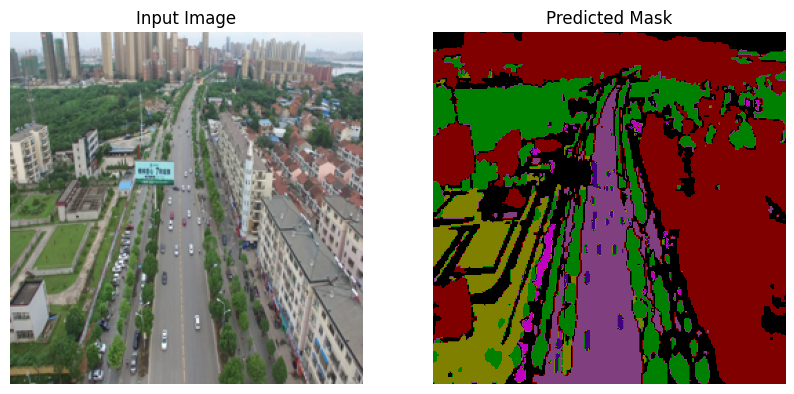

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


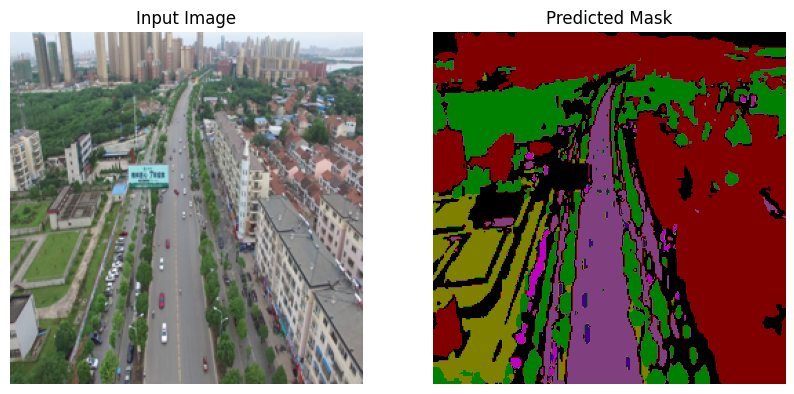

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


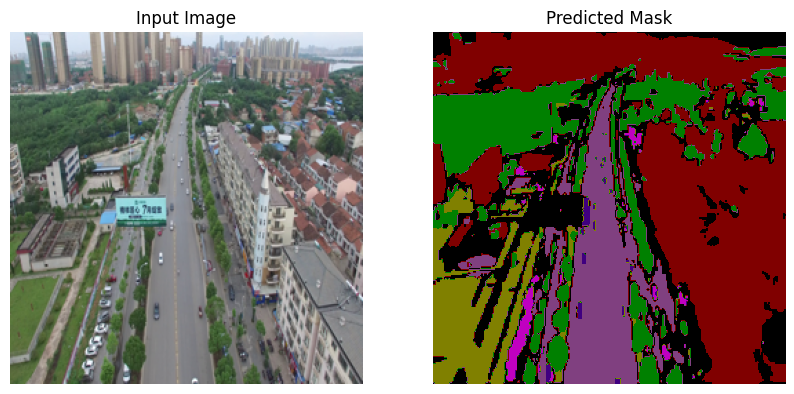

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


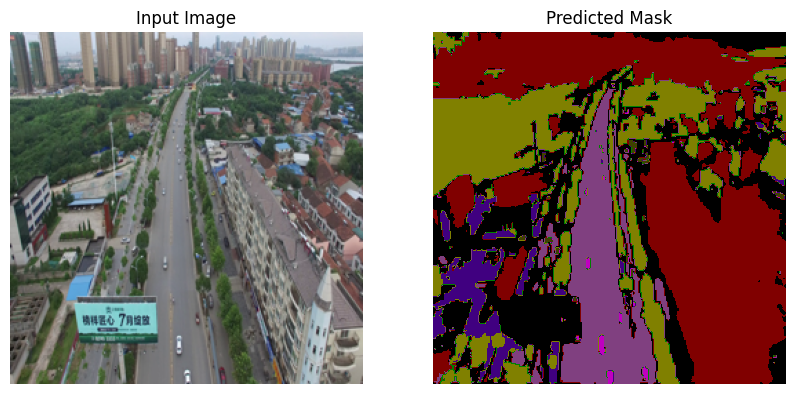

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


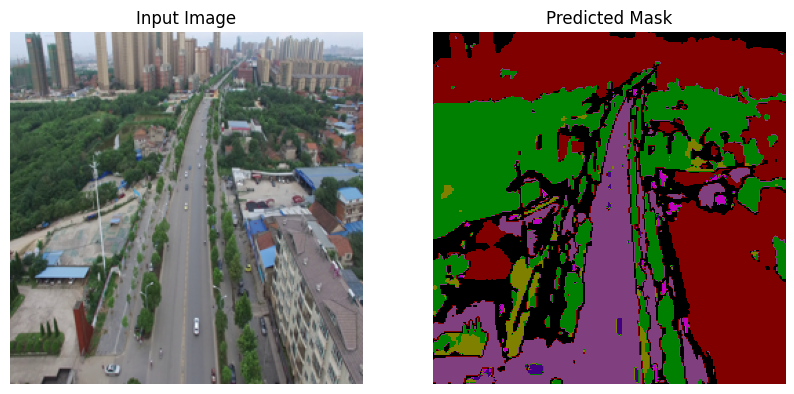

In [87]:
show_test_predictions(test_images, num=5, model=unet)

### FCN

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


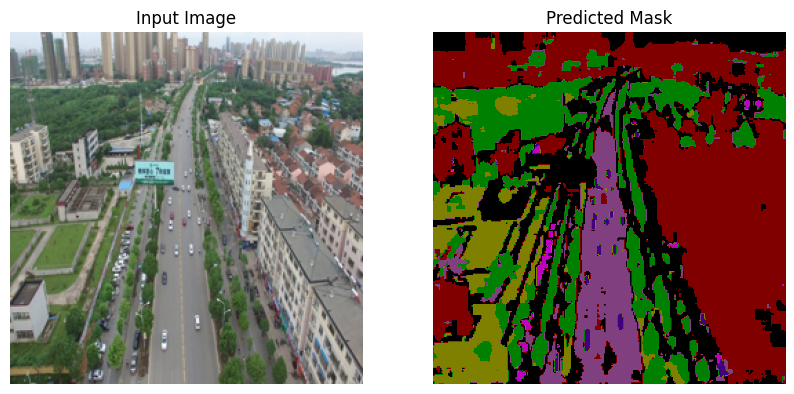

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


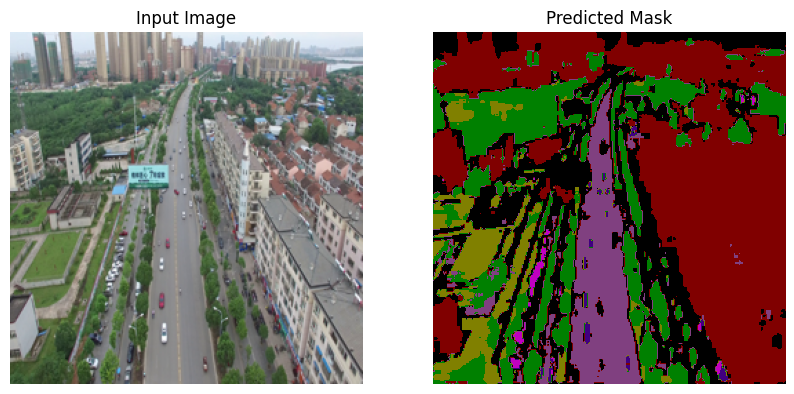

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


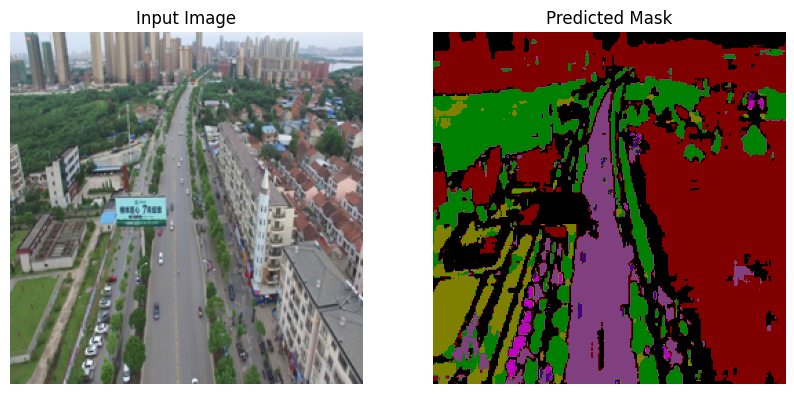

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


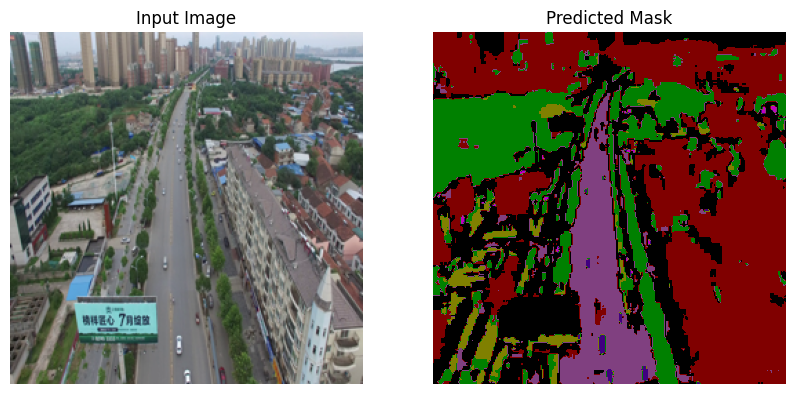

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


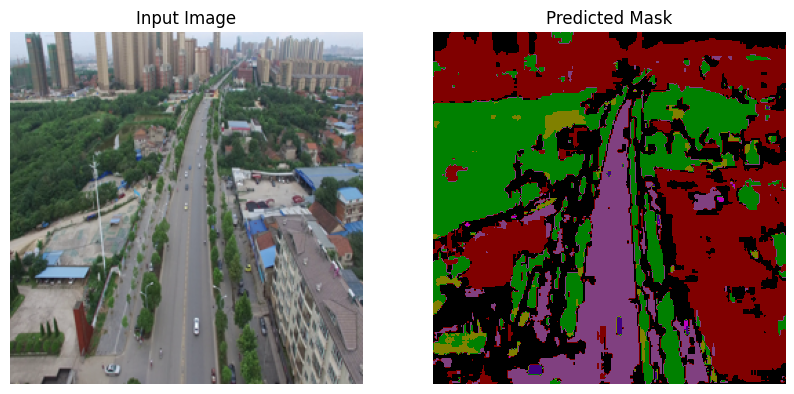

In [88]:
show_test_predictions(test_images, num=5, model=FCN)

### DeepLabV3

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


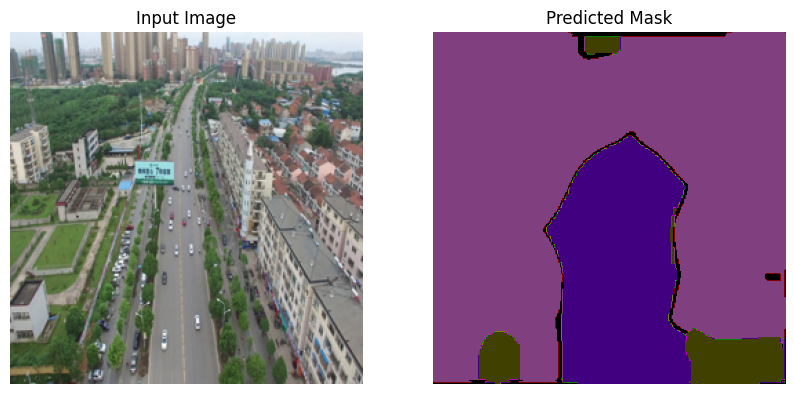

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


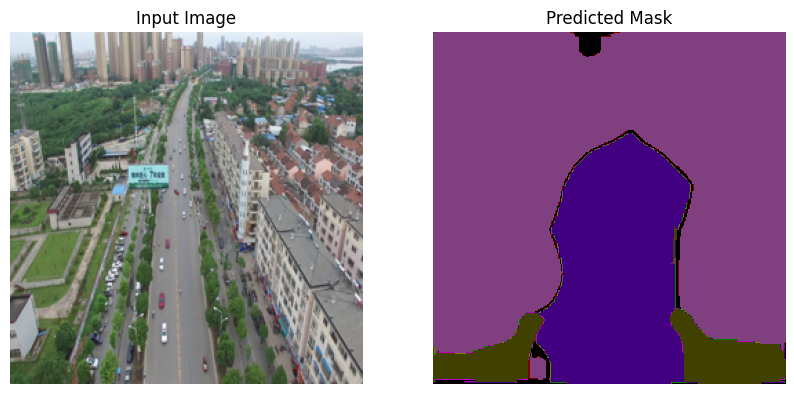

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


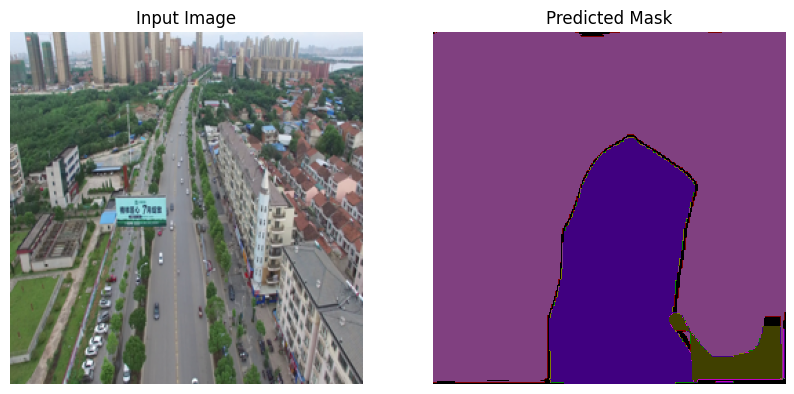

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


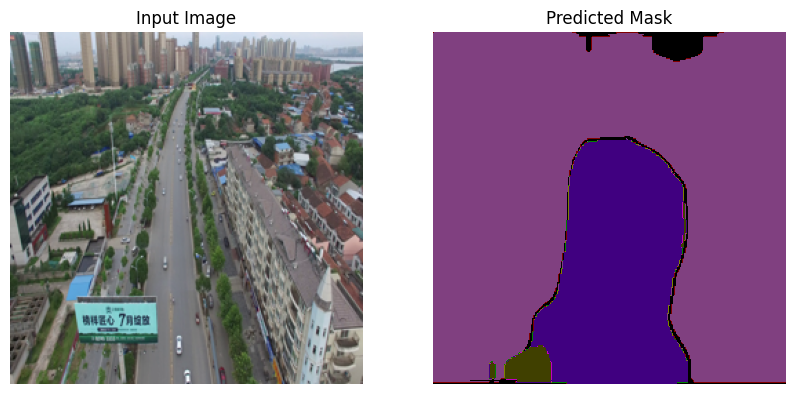

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


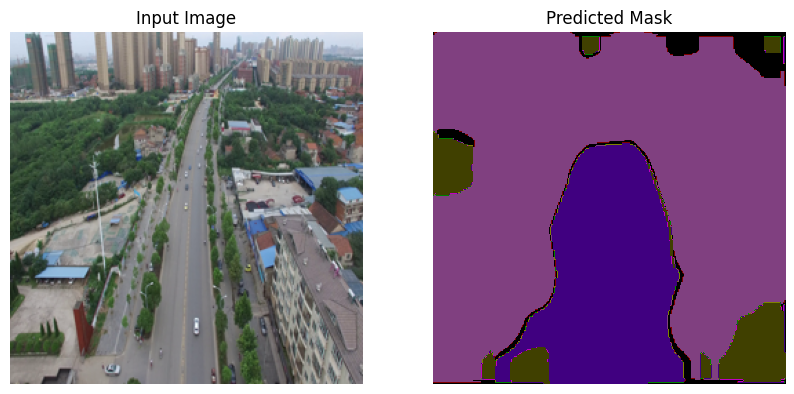

In [49]:
show_test_predictions(test_images, num=5, model=model3)